# Assignment: Features, Matching and Homographies
- Alumno 1: Javier Pérez Vargas
- Alumno 2: Mario Ruiz Vaquett
- Alumno 3: Gonzalo Lope Carrasco

The goal of the programming project in the “Fundamentos de Análisis de Imagen” course is to put into practice your understanding of the material covered in class to develop proficiency in using the OpenCV library for digital image processing, emphasizing fundamentals of feature representation and scene stitching. Note that you cannot use the Stitcher class of OpenCV.

Follow the link above to download the images: [https://drive.upm.es/s/mW7CrA0V6idTTvW](https://drive.upm.es/s/mW7CrA0V6idTTvW)

In [1]:
import os
import cv2
import copy
import itertools
import numpy as np

print("OpenCV " + cv2.__version__)

OpenCV 4.8.1


In [2]:
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rc("figure", dpi=60)
plt.rcParams['figure.figsize'] = [40, 10] # figure size in inches

def draw_images(imgs):
    if len(imgs) > 1:
        fig, axs = plt.subplots(1, len(imgs))
        for idx, img in enumerate(imgs):
            axs[idx].axis("off")
            axs[idx].imshow(img)
    else:
        fig, ax = plt.subplots()
        ax.axis("off")
        ax.imshow(imgs[0])
    plt.show()

## **Part 1: Homography-based planar object detection**

In [3]:
filenames = ["images/pkmn.png", "images/bus.png"]

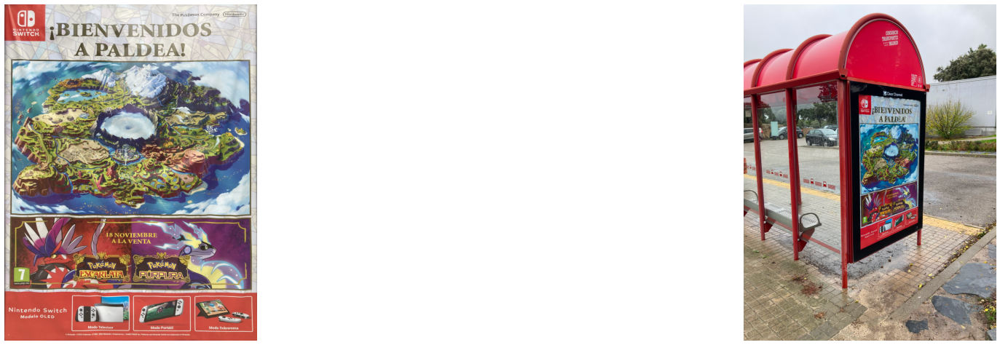

In [4]:
cartel = cv2.imread(filenames[0])
cartel = cv2.cvtColor(cartel, cv2.COLOR_BGR2RGB)
cartel_gray = cv2.cvtColor(cartel, cv2.COLOR_RGB2GRAY)

marquesina = cv2.imread(filenames[1], cv2.COLOR_BGR2RGB)
marquesina = cv2.cvtColor(marquesina, cv2.COLOR_BGR2RGB)
marquesina_gray = cv2.cvtColor(marquesina, cv2.COLOR_RGB2GRAY)

imgs = [cartel, marquesina]
draw_images(imgs)

#### Detect keypoints and extract local invariant descriptors from the two input images.

In [5]:
#Si queremos usar ORB, ponemos la variable SIFT en FALSE
usar_sift = False
if usar_sift:
    model = cv2.SIFT_create(nfeatures=20000, nOctaveLayers=2, contrastThreshold=0.05, edgeThreshold=5, sigma=1.2)
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
else:
    model = cv2.ORB_create(nfeatures=10000, scaleFactor=1.2, nlevels=8, edgeThreshold=31, firstLevel=0, WTA_K=2, scoreType=cv2.ORB_HARRIS_SCORE, patchSize=30, fastThreshold=20)
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

In [6]:
def apply_descriptor(img_color, model):
    img_gray = cv2.cvtColor(img_color, cv2.COLOR_BGR2GRAY)
    detection = model.detect(img_gray)
    return detection

kpoints1 = apply_descriptor(img_color=cartel, model=model)
kpoints2 = apply_descriptor(img_color=marquesina, model=model)

In [7]:
keypoints = [kpoints1, kpoints2]

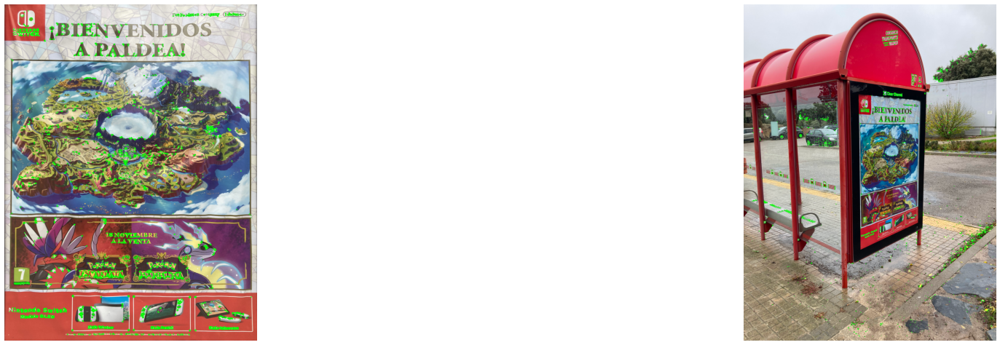

In [8]:
### TODO
# Draw key points
_imgs = copy.deepcopy(imgs)
for idx in range(len(_imgs)):
    cv2.drawKeypoints(_imgs[idx], keypoints[idx], _imgs[idx], (0, 255, 0), flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT)
draw_images(_imgs)

#### Match the descriptors between the two images.

In [9]:
kp1, des1 = model.compute(cartel_gray, keypoints[0])
kp2, des2 = model.compute(marquesina_gray, keypoints[1])

In [10]:
matches = bf.match(des1, des2)

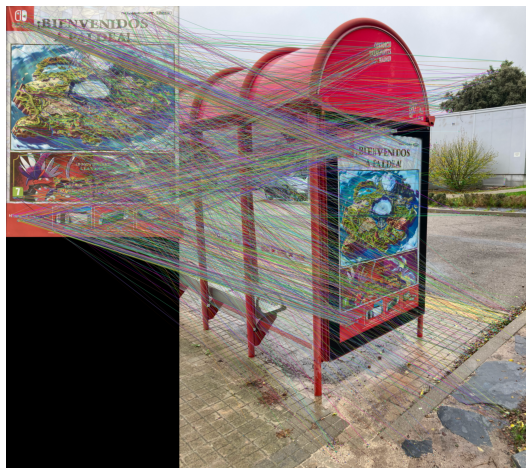

In [11]:
img3 = cv2.drawMatches(cartel, keypoints[0], marquesina, keypoints[1], matches, None, flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT)
draw_images([img3])

#### Use the RANSAC algorithm to estimate a homography matrix H using the matched feature vectors and draw correct matches.

https://docs.opencv.org/3.0-beta/doc/py_tutorials/py_feature2d/py_feature_homography/py_feature_homography.html

In [12]:
src_pts = np.float32([ kp1[m.queryIdx].pt for m in matches ])
dst_pts = np.float32([ kp2[m.trainIdx].pt for m in matches ])

M, inliers = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 50)
M

array([[9.06605592e-01, 8.46610878e-02, 1.36849017e+03],
       [2.75057097e-01, 1.06173110e+00, 1.10144781e+03],
       [1.94419827e-04, 5.15840643e-05, 1.00000000e+00]])

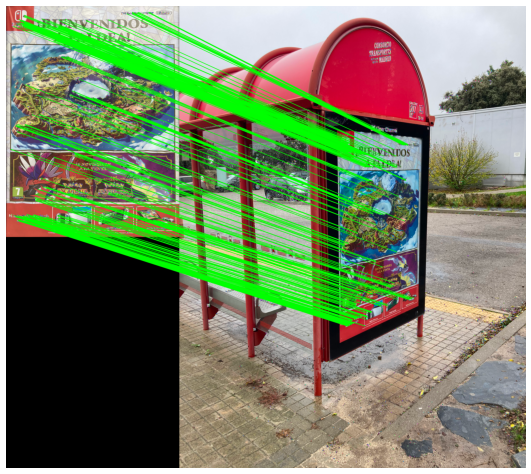

In [13]:
# Draw correct matches
draw_params = dict(matchColor=(0,255,0), singlePointColor=None, matchesMask=inliers.ravel().tolist(), flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT)
img = cv2.drawMatches(imgs[0], keypoints[0], imgs[1], keypoints[1], matches, None, matchesThickness=3, **draw_params)
draw_images([img])

In [14]:
ayto = cv2.imread("images/ayto.png")
ayto = cv2.cvtColor(ayto, cv2.COLOR_BGR2RGB)
ayto_resized = cv2.resize(ayto, cartel.shape[:2][::-1])

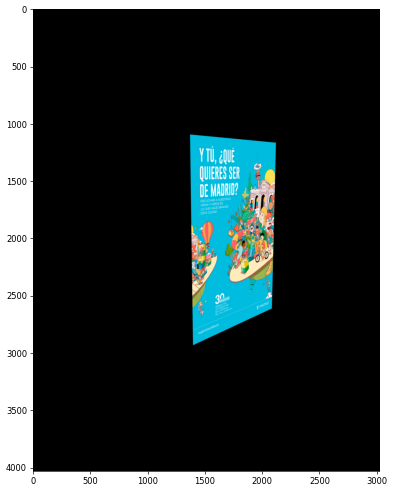

In [15]:
proj_img = cv2.warpPerspective(src=ayto_resized,
                            M=M,
                            dsize=(marquesina.shape[1], marquesina.shape[0]))
plt.imshow(proj_img)
plt.show()

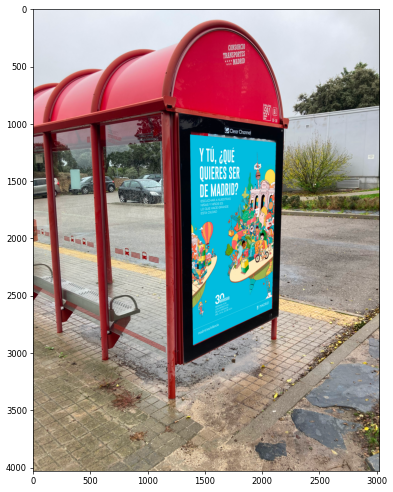

In [16]:
overlay = marquesina.copy()
mask = np.any(proj_img != 0, axis=2)
overlay[mask] = proj_img[mask]
plt.imshow(overlay)
plt.show()

#### Once camera resectioning is done from an estimated homography, this information is used to insert another image, with the correct perspective, appearing to be part of the original scene.

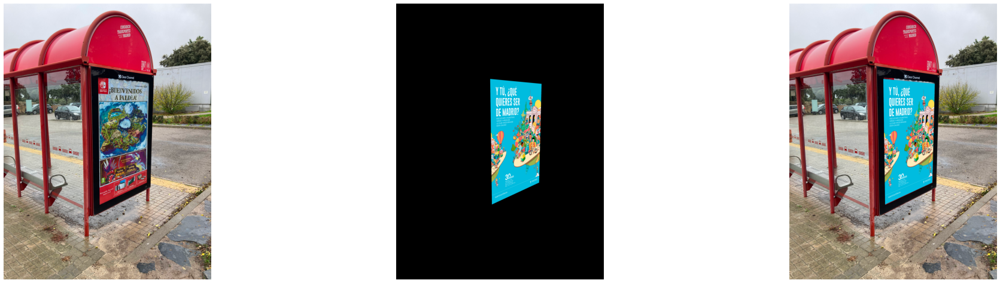

In [17]:
### TODO
# Draw overlay
draw_images([imgs[1], proj_img, overlay])

## **Part 2: Stitch five images together to create a panorama**

In [18]:
filenames = ["images/1.png", "images/2.png", "images/3.png", "images/4.png", "images/5.png"]

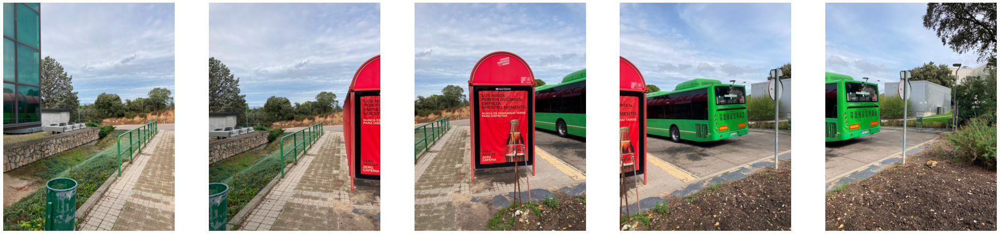

In [19]:
### TODO
imgs = []
for filename in filenames:
    img = cv2.imread(filename)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    imgs.append(img)
# Draw images
draw_images(imgs)

#### The goal of this part of the assignment is to combine five horizontally overlapping photographs into a single panoramic image. Images must be supplied in left-to-right order.

In [20]:
keypoints = [model.detect(img) for img in imgs]

In [21]:
descriptors = [model.compute(img, kp)[1] for img, kp in zip(imgs, keypoints)]
matches = [bf.match(descriptors[i], descriptors[i+1]) for i in range(0, len(descriptors)-1)]
pairs = [(0, 1), (1, 2), (2, 3), (3, 4)]

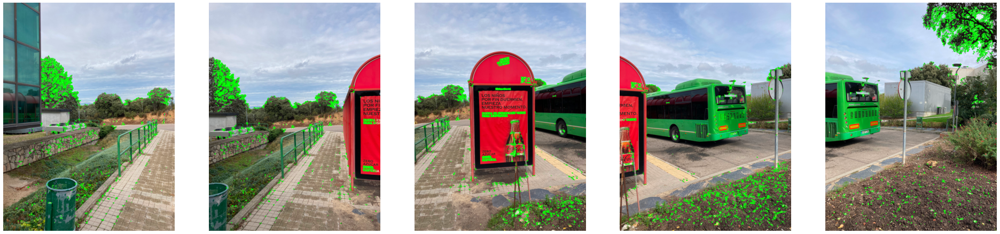

In [22]:
### TODO
# Draw key points
_imgs = copy.deepcopy(imgs)
for idx in range(len(_imgs)):
    cv2.drawKeypoints(_imgs[idx], keypoints[idx], _imgs[idx], (0, 255, 0), flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT)
draw_images(_imgs)

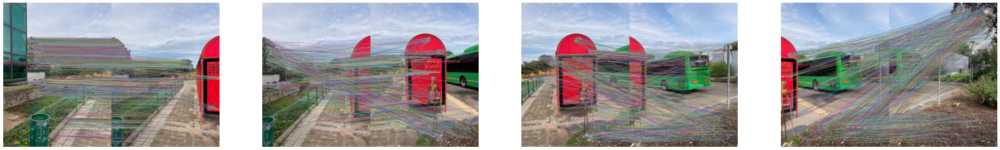

In [23]:
### TODO
# Draw all matches
_imgs = []
for idx, (elem1, elem2) in enumerate(pairs):
    _imgs.append(cv2.drawMatches(imgs[elem1], keypoints[elem1], imgs[elem2], keypoints[elem2], matches[idx], None, flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT))
draw_images(_imgs)

In [24]:
def calculateHomografia(matches, kp1, kp2):
    src_pts = np.float32([ kp1[m.queryIdx].pt for m in matches ])
    dst_pts = np.float32([ kp2[m.trainIdx].pt for m in matches ])
    M, inliers = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 50)
    return M, inliers

# TODO Change to not recall calculateHomografia
Ms = [calculateHomografia(matches[i], keypoints[pairs[i][0]], keypoints[pairs[i][1]])[0] for i in range(len(matches))]
masks_inliers = [calculateHomografia(matches[i], keypoints[pairs[i][0]], keypoints[pairs[i][1]])[1] for i in range(len(matches))]

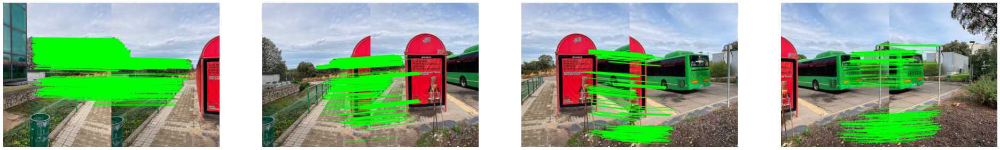

In [25]:
### TODO
# Draw correct matches
_imgs = []
for idx, (elem1, elem2) in enumerate(pairs):
    draw_params = dict(matchColor=(0,255,0), singlePointColor=None, matchesMask=masks_inliers[idx].ravel().tolist(), flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT)
    _imgs.append(cv2.drawMatches(imgs[elem1], keypoints[elem1], imgs[elem2], keypoints[elem2], matches[idx], None, matchesThickness=3, **draw_params))
draw_images(_imgs)

In [26]:
def WarpCompleteImage(img1, img2, img2_keypoints, H):
    # Calculamos las dimensiones de las dos imágenes: Altura y ancho
    h1,w1 = img1.shape[0], img1.shape[1]
    h2,w2 = img2.shape[0], img2.shape[1]

    # Calculamos los puntos de las esquinas de ambas imágenes 
    pts1 = np.float32([[0,0],[0,h1],[w1,h1],[w1,0]]).reshape(-1,1,2)
    pts2 = np.float32([[0,0],[0,h2],[w2,h2],[w2,0]]).reshape(-1,1,2)
    
    # Transformamos los puntos de la imagen 2 para obtener las nuevas coordenadas
    pts2_transformed = cv2.perspectiveTransform(pts2, H)

    # Unimos todos los puntos para luego hallar el maximo y el minimo
    pts = np.concatenate((pts1, pts2_transformed), axis=0)
    # Calculamos el mínimo y el máximo de las coordenadas de x e y
    [xmin, ymin] = np.int32(pts.min(axis=0).ravel() - 0.5)
    [xmax, ymax] = np.int32(pts.max(axis=0).ravel() + 0.5)

    # Obtenemos el tx y el ty para la matriz de traslación 
    tx = -xmin
    ty = -ymin

    # Creamos la matriz de traslación para que se vea toda la imagen, usando el mínimo de las coordenadas de x e y transformadas
    Ht = np.array([[1,0,tx],[0,1,ty],[0,0,1]]) 

    # Aplicamos la trasformación multiplicando la matriz de traslación por la matriz de homografía
    result = cv2.warpPerspective(img2, Ht.dot(H), (xmax-xmin, ymax-ymin))

    # Sustituimos los pixeles de la primera imagen en la segunda transformada
    mask = np.all(img1 == 0, axis=2)
    img1 = np.where(img1 == 0, img1+1,img1)
    img1[mask] = [0,0,0]
    result[ty:h1+ty, tx:w1+tx] = np.where(img1 != 0, img1, result[ty:h1+ty, tx:w1+tx])

    # Transformamos los keypoints de la imagen 1
    test_keypoints_arr = np.array([i.pt for i in img2_keypoints] )
    keypoints_transformed = cv2.perspectiveTransform(test_keypoints_arr.reshape(-1,1,2), Ht.dot(H))
    # Creamos los nuevos keypoints trasladados
    keypoints_transformed = [cv2.KeyPoint(x, y, 1) for x,y in keypoints_transformed.reshape(-1,2)]

    return result, keypoints_transformed, (tx, ty)

In [27]:
def CreatePanoramic(images, keypoints_imgs, matches_pairs, idx):
    # Se selecciona la imagen en la posición 'idx' como base para la panorámica
    result = images[idx]
    # Fusión hacia la izquierda de la imagen base
    for i in range(idx-1, -1, -1):
        # Se seleccionan el conjunto de matches correspondientes
        matches_it = matches_pairs[i]
        # Se obtienen los keypoints correspondientes de las imágenes
        src_pts = np.float32([ keypoints_imgs[i][m.queryIdx].pt for m in matches_it ])
        dst_pts = np.float32([ keypoints_imgs[i+1][m.trainIdx].pt for m in matches_it ])
        # Se calcula la homografía entre los keypoints utilizando RANSAC
        M, inliers = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 50)
        # Se realiza la transformación y fusión de las imágenes
        result, new_kps, t = WarpCompleteImage(result, images[i], keypoints_imgs[i], M)
        # Se ajustan los keypoints de la imagen base para mantener la coherencia en la panorámica
        keypoints_imgs[idx] = [cv2.KeyPoint(kp.pt[0]+t[0], kp.pt[1]+t[1], 1) for kp in
        keypoints_imgs[idx]]
        # Se actualizan los keypoints de la imagen transformada
        keypoints_imgs[i] = new_kps
        # Fusión hacia la derecha de la imagen base

    for i in range(idx+1, len(imgs)):
        # Se seleccionan el conjunto de matches correspondientes
        matches_it = matches_pairs[i-1]
        # Se obtienen los keypoints correspondientes de las imágenes
        src_pts = np.float32([ keypoints_imgs[i-1][m.queryIdx].pt for m in matches_it ])
        dst_pts = np.float32([ keypoints_imgs[i][m.trainIdx].pt for m in matches_it ])
        # Se calcula la homografía entre los keypoints (en sentido contrario) utilizando RANSAC
        M, inliers = cv2.findHomography(dst_pts, src_pts, cv2.RANSAC, 50)
        # Se realiza la transformación y fusión de las imágenes
        result, new_kps, t = WarpCompleteImage(result, images[i], keypoints_imgs[i], M)
        # Se actualizan los keypoints de la imagen transformada
        keypoints_imgs[i] = new_kps
    return result  

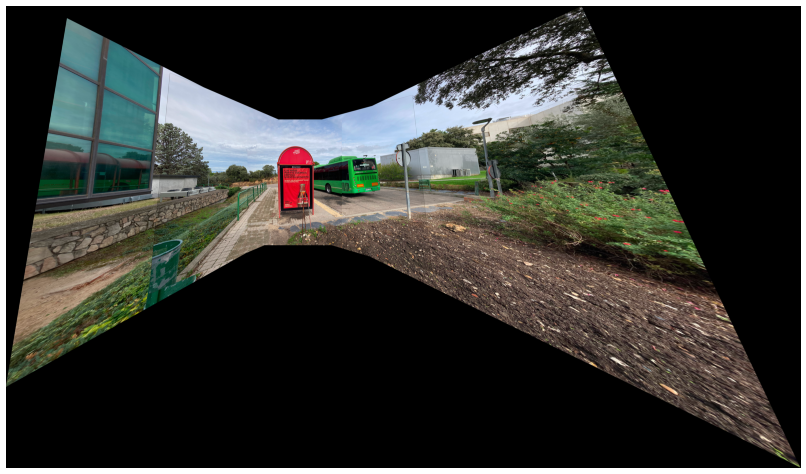

In [28]:
img = CreatePanoramic(imgs, keypoints, matches, 2)
### TODO
# Draw panorama
draw_images([img])

## **Part 3: Warp 7 images over a new projection to create a wide panorama**

In [29]:
filenames = ["images/0.png", "images/1.png", "images/2.png", "images/3.png", "images/4.png", "images/5.png", "images/6.png"]

In [30]:
def project_image_to_cilinder(img, f = 1700):
    x_cent = img.shape[1] // 2
    y_cent = img.shape[0] // 2
    temp = np.indices(img.shape[:2])
    x_coords = temp[1]
    y_coords = temp[0]
    theta = (x_coords - x_cent) / f
    h = (y_coords - y_cent) / f
    x_hat =  np.sin(theta)
    y_hat = h
    z_hat = np.cos(theta)
    new_x = f * (x_hat / z_hat) + x_cent
    new_y = f * (y_hat / z_hat) + y_cent
    new_img = cv2.remap(img, new_x.astype(np.float32), new_y.astype(np.float32), cv2.INTER_CUBIC)
    return new_img

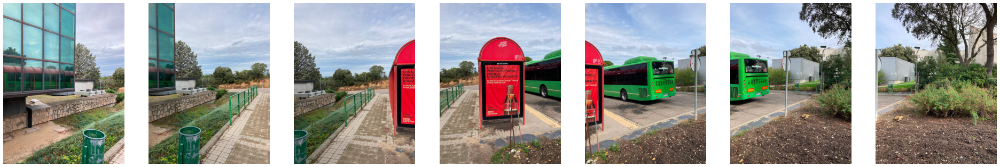

In [31]:
imgs = [cv2.imread(filename) for filename in filenames]
imgs = [cv2.cvtColor(img, cv2.COLOR_BGR2RGB) for img in imgs]
draw_images(imgs)

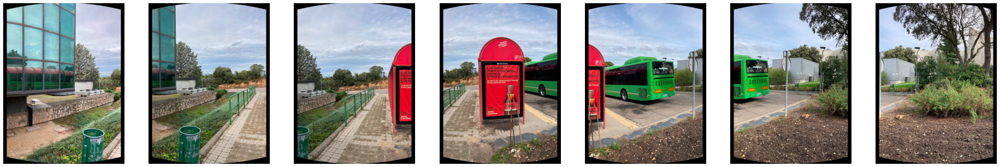

In [32]:
imgs = [project_image_to_cilinder(img) for img in imgs]

### TODO
# Draw images
draw_images(imgs)

In [33]:
new_keypoints = [model.detect(img) for img in imgs]
new_descriptors = [model.compute(img, kp)[1] for img, kp in zip(imgs, new_keypoints)]
new_matches = [bf.match(new_descriptors[i], new_descriptors[i+1]) for i in range(0, len(new_descriptors)-1)]

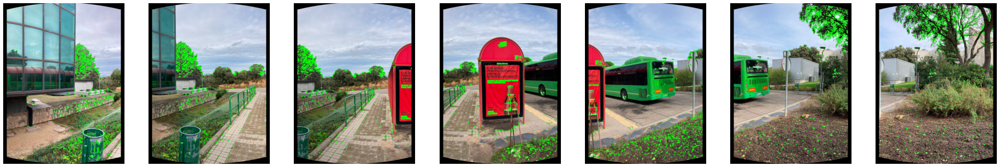

In [34]:
_imgs = copy.deepcopy(imgs)
for idx in range(len(_imgs)):
    cv2.drawKeypoints(_imgs[idx], new_keypoints[idx], _imgs[idx], (0, 255, 0), flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT)
draw_images(_imgs)

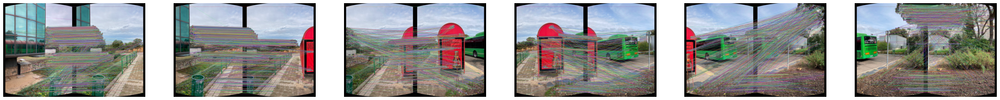

In [35]:
pairs = [(0, 1), (1, 2), (2, 3), (3, 4), (4, 5), (5, 6)]
_imgs = []
for idx, (elem1, elem2) in enumerate(pairs):
    _imgs.append(cv2.drawMatches(imgs[elem1], new_keypoints[elem1], imgs[elem2], new_keypoints[elem2], new_matches[idx], None, flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT))
draw_images(_imgs)

In [36]:
Ms = [calculateHomografia(new_matches[i], new_keypoints[pairs[i][0]], new_keypoints[pairs[i][1]])[0] for i in range(len(new_matches))]
masks_inliers = [calculateHomografia(new_matches[i], new_keypoints[pairs[i][0]], new_keypoints[pairs[i][1]])[1] for i in range(len(new_matches))]

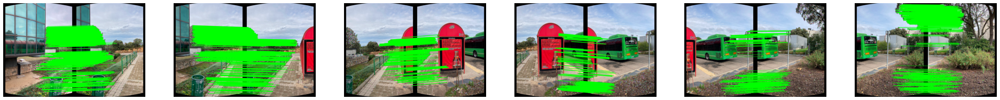

In [37]:
_imgs = []
for idx, (elem1, elem2) in enumerate(pairs):
    draw_params = dict(matchColor=(0,255,0), singlePointColor=None, matchesMask=masks_inliers[idx].ravel().tolist(), flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT)
    _imgs.append(cv2.drawMatches(imgs[elem1], new_keypoints[elem1], imgs[elem2], new_keypoints[elem2], new_matches[idx], None, matchesThickness=3, **draw_params))
draw_images(_imgs)

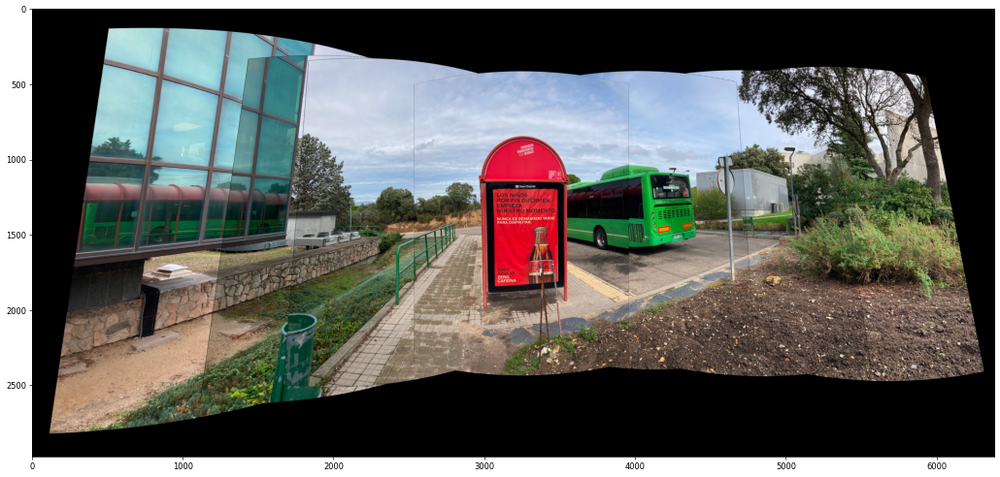

In [38]:
porfin = CreatePanoramic(imgs, new_keypoints, new_matches, 3)
plt.imshow(porfin)
plt.show()

# Instructions for submission

Please write a document (pdf) describing the problem and the process that you have followed to reach your solutions. In your submission via Moodle, also include your Jupyter Notebook source file with the results of computations attached to the code which generated them.
The project assignment must be done in **groups of 3 students maximum**. Each group must submit one report for the assignment.
Your report should be submitted by **Friday, January 12th, 2024, 23:55h**.
